# Generative Adversarial Network (GAN) - Lab
#### Author: Kamil Barszczak

In [1]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import numpy as np
import time
import glob
import cv2
import os

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchsummary
import torchvision.utils as vutils

#### Notebook parameters

In [2]:
dataset_path = 'E:/Data/CUB_200_2011'
train_test_split = 0.9
width, height = 64, 64
latent_dim = 256
epochs = 500
batch = 64

#### Set up device

In [3]:
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
print(device)

cuda:0


#### Load and process data

In [4]:
bboxes = pd.read_csv(os.path.join(dataset_path, 'bounding_boxes.txt'), sep = " ", names=["id", "x", "y", "width", "height"]).astype(int)
annotations = pd.read_csv(os.path.join(dataset_path, 'images.txt'), sep = " ", names=["id", "path"])

processed = []
for index, row in tqdm(annotations.iterrows()):
    image_id = row.id
    image_path = row.path
    bbox  = bboxes[bboxes.id == image_id].iloc[0]
    
    img = cv2.imread(os.path.join(dataset_path, "images", image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[bbox.y:bbox.y + bbox.height, bbox.x:bbox.x + bbox.width, :]
    img = cv2.resize(img, (width, height))
    img = np.transpose((img.astype('float32') / 127.5 - 1), (2, 0, 1))
    
    processed.append(img)

11788it [00:43, 268.54it/s]


In [5]:
processed = np.array(processed)
np.random.shuffle(processed)
split = int(len(processed) * train_test_split)

train_dataloader = data.DataLoader(
    data.TensorDataset(torch.Tensor(processed[:split])),
    batch_size=batch,
    shuffle=True,
    drop_last=True
)

test_dataloader = data.DataLoader(
    data.TensorDataset(torch.Tensor(processed[split:])),
    batch_size=batch,
    drop_last=True
)

print("Train dataloader size:", len(train_dataloader))
print("Test dataloader size:", len(test_dataloader))

Train dataloader size: 165
Test dataloader size: 18


#### Create custom layers

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
class Generator(nn.Module):
    def __init__(self, latent_dim=latent_dim, o_activation=nn.Tanh(),
                dense_info = {
                    "neurons": [(256, 4, 4)],
                    "activations": [nn.PReLU()],
                    "use_norms": [False],
                    "dropouts": [0.25]
                },
                conv_info = {
                    "filters": [1028, 512, 256, 128], 
                    "sizes": [4, 4, 4, 4], 
                    "strides": [2, 2, 2, 2], 
                    "activations": [nn.PReLU(), nn.PReLU(), nn.PReLU(), nn.PReLU()], 
                    "use_norms": [True, True, True, True], 
                    "dropouts": [0.1, 0.1, 0.1, 0.1]
                }):
        super(Generator, self).__init__()
        
        last_output_size = latent_dim  # holds the size of the lately created layer
        modules = []  # array for the net modules
        
        # create proper dense layers
        for dn, da, dun, dd in zip(dense_info['neurons'], dense_info['activations'], dense_info['use_norms'], dense_info['dropouts']):
            current_size = dn[0] * dn[1] * dn[2]
            modules.append(nn.Linear(last_output_size, current_size))
            if dun:
                modules.append(nn.BatchNorm1d(current_size, momentum=0.5))
            if da is not None:
                modules.append(da)
            if dd > 0:
                modules.append(nn.Dropout(dd))
                
            last_output_size = current_size
            
        # reshape dense layers to 2d shape
        modules.append(nn.Unflatten(1, dense_info['neurons'][-1]))
        last_output_size = dense_info['neurons'][-1][0]
            
        # create proper conv transpose layers
        for cf, csiz, cstr, ca, cun, cd in zip(conv_info['filters'], conv_info['sizes'], conv_info['strides'], conv_info['activations'], conv_info['use_norms'], conv_info['dropouts']):
            modules.append(nn.ConvTranspose2d(last_output_size, cf, csiz, cstr, 1, bias=False))
            if cun:
                modules.append(nn.BatchNorm2d(cf, momentum=0.5))
            if ca is not None:
                modules.append(ca)
            if cd > 0:
                modules.append(nn.Dropout(dd))
            
            last_output_size = cf
            
        # add the output layers
        modules.append(nn.Conv2d(last_output_size, 3, 1, bias=False))
        modules.append(o_activation)
        
        # create sequential model out of generated modules
        self.main = nn.Sequential(*modules)

    def forward(self, input):
        return self.main(input)

In [8]:
class Discriminator(nn.Module):
    def __init__(self, input_shape=(3, height, width), o_activation=nn.Sigmoid(), flatten_shape=8192,
                dense_info = {
                    "neurons": [32],
                    "activations": [nn.PReLU()],
                    "use_norms": [False],
                    "dropouts": [0.25]
                },
                conv_info = {
                    "filters": [64, 128, 256, 512], 
                    "sizes": [4, 4, 4, 4], 
                    "strides": [2, 2, 2, 2], 
                    "activations": [nn.PReLU(), nn.PReLU(), nn.PReLU(), nn.PReLU()], 
                    "use_norms": [True, True, True, True], 
                    "dropouts": [0.1, 0.1, 0.1, 0.1]
                }):
        super(Discriminator, self).__init__()
        
        last_output_size = input_shape[0]  # holds the size of the lately created layer
        modules = []  # array for the net modules
        
        # create proper conv layers
        for cf, csiz, cstr, ca, cun, cd in zip(conv_info['filters'], conv_info['sizes'], conv_info['strides'], conv_info['activations'], conv_info['use_norms'], conv_info['dropouts']):
            modules.append(nn.Conv2d(last_output_size, cf, csiz, cstr, 1, bias=False))
            if cun:
                modules.append(nn.BatchNorm2d(cf, momentum=0.5))
            if ca is not None:
                modules.append(ca)
            if cd > 0:
                modules.append(nn.Dropout(cd))
            
            last_output_size = cf
            
        # reshape dense layers to 2d shape
        modules.append(nn.Flatten(1, 3))
        last_output_size = flatten_shape
        
        # create proper dense layers
        for dn, da, dun, dd in zip(dense_info['neurons'], dense_info['activations'], dense_info['use_norms'], dense_info['dropouts']):
            modules.append(nn.Linear(last_output_size, dn))
            if dun:
                modules.append(nn.BatchNorm1d(current_size, momentum=0.5))
            if da is not None:
                modules.append(da)
            if dd > 0:
                modules.append(nn.Dropout(dd))
                
            last_output_size = dn
            
        # add the output layers
        modules.append(nn.Linear(last_output_size, 1))
        modules.append(o_activation)
        
        # create sequential model out of generated modules
        self.main = nn.Sequential(*modules)

    def forward(self, input):
        return self.main(input)

In [9]:
gan_generator = Generator().to(device)
gan_generator.apply(weights_init)
torchsummary.summary(gan_generator, (latent_dim, ))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                 [-1, 4096]       1,052,672
             PReLU-2                 [-1, 4096]               1
           Dropout-3                 [-1, 4096]               0
         Unflatten-4            [-1, 256, 4, 4]               0
   ConvTranspose2d-5           [-1, 1028, 8, 8]       4,210,688
       BatchNorm2d-6           [-1, 1028, 8, 8]           2,056
             PReLU-7           [-1, 1028, 8, 8]               1
           Dropout-8           [-1, 1028, 8, 8]               0
   ConvTranspose2d-9          [-1, 512, 16, 16]       8,421,376
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
            PReLU-11          [-1, 512, 16, 16]               1
          Dropout-12          [-1, 512, 16, 16]               0
  ConvTranspose2d-13          [-1, 256, 32, 32]       2,097,152
      BatchNorm2d-14          [-1, 256,

In [10]:
gan_discriminator = Discriminator().to(device)
gan_discriminator.apply(weights_init)
torchsummary.summary(gan_discriminator, (3, height, width))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
       BatchNorm2d-2           [-1, 64, 32, 32]             128
             PReLU-3           [-1, 64, 32, 32]               1
           Dropout-4           [-1, 64, 32, 32]               0
            Conv2d-5          [-1, 128, 16, 16]         131,072
       BatchNorm2d-6          [-1, 128, 16, 16]             256
             PReLU-7          [-1, 128, 16, 16]               1
           Dropout-8          [-1, 128, 16, 16]               0
            Conv2d-9            [-1, 256, 8, 8]         524,288
      BatchNorm2d-10            [-1, 256, 8, 8]             512
            PReLU-11            [-1, 256, 8, 8]               1
          Dropout-12            [-1, 256, 8, 8]               0
           Conv2d-13            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-14            [-1, 51

#### Train the net

Examples generated for fixed noise:


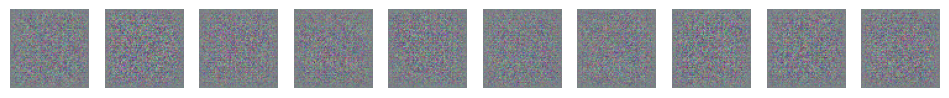

[  1/500][165/165]	(eta: 00:01:21)	loss_d: 1.3011	loss_g: 3.4545	real_avg: 0.8604	fake_avg: 0.6529 / 0.0404
[  2/500][165/165]	(eta: 00:01:08)	loss_d: 0.7264	loss_g: 4.1500	real_avg: 0.9010	fake_avg: 0.4150 / 0.0191
[  3/500][165/165]	(eta: 00:01:05)	loss_d: 1.0270	loss_g: 1.2372	real_avg: 0.4795	fake_avg: 0.1921 / 0.31001
[  4/500][165/165]	(eta: 00:01:05)	loss_d: 0.8309	loss_g: 1.9131	real_avg: 0.6428	fake_avg: 0.2797 / 0.1726
[  5/500][165/165]	(eta: 00:01:06)	loss_d: 0.6965	loss_g: 2.8671	real_avg: 0.7743	fake_avg: 0.3180 / 0.0780
Examples generated for fixed noise:


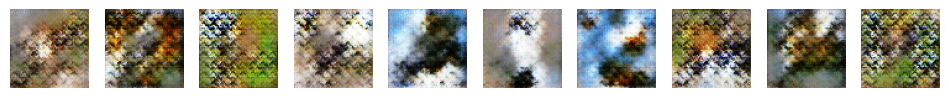

[  6/500][165/165]	(eta: 00:01:02)	loss_d: 1.2493	loss_g: 3.0475	real_avg: 0.9056	fake_avg: 0.6261 / 0.0632
[  7/500][165/165]	(eta: 00:01:07)	loss_d: 1.2913	loss_g: 0.6303	real_avg: 0.3802	fake_avg: 0.0933 / 0.5762
[  8/500][165/165]	(eta: 00:01:05)	loss_d: 0.7206	loss_g: 6.0158	real_avg: 0.9058	fake_avg: 0.4094 / 0.0073
[  9/500][165/165]	(eta: 00:01:05)	loss_d: 0.5079	loss_g: 5.3376	real_avg: 0.9106	fake_avg: 0.2971 / 0.0098
[ 10/500][165/165]	(eta: 00:01:06)	loss_d: 0.1703	loss_g: 3.6536	real_avg: 0.8769	fake_avg: 0.0144 / 0.0530
Generator saved to: './models/gen_gl=6.139834403991699_dl=0.3934151232242584_e=11_t=1685452866.pth'
Discriminator saved to: './models/dis_gl=6.139834403991699_dl=0.3934151232242584_e=11_t=1685452866.pth'
Examples generated for fixed noise:


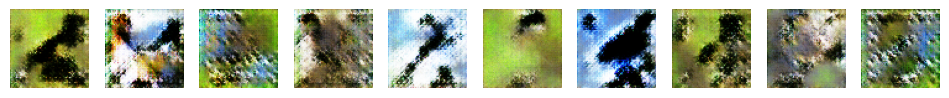

[ 11/500][165/165]	(eta: 00:01:02)	loss_d: 0.5296	loss_g: 3.3290	real_avg: 0.6496	fake_avg: 0.0036 / 0.0914
[ 12/500][165/165]	(eta: 00:01:06)	loss_d: 1.3742	loss_g: 3.1021	real_avg: 0.3719	fake_avg: 0.0009 / 0.13472
[ 13/500][165/165]	(eta: 00:01:06)	loss_d: 0.4208	loss_g: 2.3049	real_avg: 0.7174	fake_avg: 0.0219 / 0.17130
[ 14/500][165/165]	(eta: 00:01:06)	loss_d: 0.4431	loss_g: 4.2134	real_avg: 0.8222	fake_avg: 0.1139 / 0.04610
[ 15/500][165/165]	(eta: 00:01:06)	loss_d: 0.2203	loss_g: 6.3799	real_avg: 0.9454	fake_avg: 0.1275 / 0.00581
Examples generated for fixed noise:


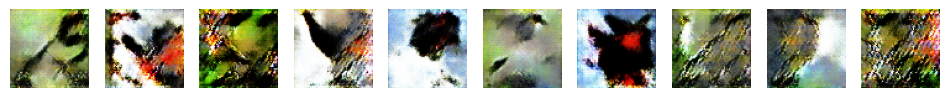

[ 16/500][165/165]	(eta: 00:01:02)	loss_d: 0.1450	loss_g: 6.5933	real_avg: 0.9909	fake_avg: 0.1147 / 0.00391
[ 17/500][165/165]	(eta: 00:01:07)	loss_d: 0.1174	loss_g: 5.0251	real_avg: 0.9280	fake_avg: 0.0240 / 0.02131
[ 18/500][165/165]	(eta: 00:01:05)	loss_d: 0.1817	loss_g: 4.7319	real_avg: 0.9444	fake_avg: 0.1035 / 0.02272
[ 19/500][165/165]	(eta: 00:01:05)	loss_d: 0.6014	loss_g: 2.3312	real_avg: 0.6564	fake_avg: 0.0036 / 0.23118
[ 20/500][165/165]	(eta: 00:01:05)	loss_d: 1.2590	loss_g: 9.3617	real_avg: 0.9980	fake_avg: 0.5882 / 0.00063
Generator saved to: './models/gen_gl=2.1158828735351562_dl=0.9713497161865234_e=21_t=1685453556.pth'
Discriminator saved to: './models/dis_gl=2.1158828735351562_dl=0.9713497161865234_e=21_t=1685453556.pth'
Examples generated for fixed noise:


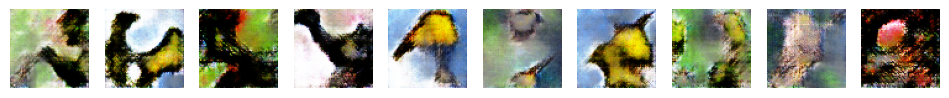

[ 21/500][165/165]	(eta: 00:01:02)	loss_d: 0.1101	loss_g: 4.4333	real_avg: 0.9599	fake_avg: 0.0525 / 0.03421
[ 22/500][165/165]	(eta: 00:01:06)	loss_d: 0.0358	loss_g: 6.7280	real_avg: 0.9921	fake_avg: 0.0264 / 0.00477
[ 23/500][165/165]	(eta: 00:01:06)	loss_d: 0.0868	loss_g: 5.7853	real_avg: 0.9751	fake_avg: 0.0514 / 0.01032
[ 24/500][165/165]	(eta: 00:01:06)	loss_d: 0.1241	loss_g: 4.1967	real_avg: 0.9338	fake_avg: 0.0385 / 0.04720
[ 25/500][165/165]	(eta: 00:01:06)	loss_d: 0.0941	loss_g: 4.9154	real_avg: 0.9331	fake_avg: 0.0161 / 0.01912
Examples generated for fixed noise:


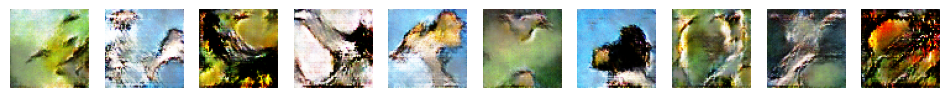

[ 26/500][165/165]	(eta: 00:01:02)	loss_d: 2.4980	loss_g: 1.1330	real_avg: 0.2013	fake_avg: 0.0011 / 0.43244
[ 27/500][165/165]	(eta: 00:01:06)	loss_d: 0.3195	loss_g: 3.0590	real_avg: 0.8392	fake_avg: 0.0920 / 0.08821
[ 28/500][165/165]	(eta: 00:01:06)	loss_d: 1.3467	loss_g: 10.9239	real_avg: 0.9961	fake_avg: 0.5988 / 0.0001
[ 29/500][165/165]	(eta: 00:01:05)	loss_d: 0.2230	loss_g: 9.7064	real_avg: 0.9914	fake_avg: 0.1491 / 0.00041
[ 30/500][165/165]	(eta: 00:01:05)	loss_d: 0.0306	loss_g: 5.3153	real_avg: 0.9921	fake_avg: 0.0219 / 0.01442
Generator saved to: './models/gen_gl=5.771804332733154_dl=0.08575793355703354_e=31_t=1685454243.pth'
Discriminator saved to: './models/dis_gl=5.771804332733154_dl=0.08575793355703354_e=31_t=1685454243.pth'
Examples generated for fixed noise:


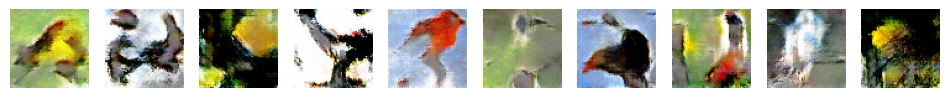

[ 31/500][165/165]	(eta: 00:01:02)	loss_d: 0.1305	loss_g: 3.9434	real_avg: 0.9076	fake_avg: 0.0196 / 0.04221
[ 32/500][165/165]	(eta: 00:01:06)	loss_d: 0.0813	loss_g: 5.2968	real_avg: 0.9623	fake_avg: 0.0371 / 0.01382
[ 33/500][165/165]	(eta: 00:01:06)	loss_d: 0.0743	loss_g: 4.7475	real_avg: 0.9517	fake_avg: 0.0174 / 0.02460
[ 34/500][165/165]	(eta: 00:01:06)	loss_d: 0.0835	loss_g: 4.5322	real_avg: 0.9842	fake_avg: 0.0618 / 0.02581
[ 35/500][165/165]	(eta: 00:01:05)	loss_d: 0.0543	loss_g: 5.8980	real_avg: 0.9954	fake_avg: 0.0458 / 0.00860
Examples generated for fixed noise:


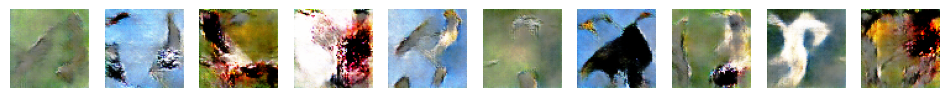

[ 36/500][165/165]	(eta: 00:01:02)	loss_d: 0.3084	loss_g: 0.8345	real_avg: 0.8295	fake_avg: 0.0020 / 0.59000
[ 37/500][165/165]	(eta: 00:01:06)	loss_d: 0.0870	loss_g: 5.1007	real_avg: 0.9686	fake_avg: 0.0491 / 0.01811
[ 38/500][165/165]	(eta: 00:01:05)	loss_d: 0.0596	loss_g: 5.9955	real_avg: 0.9965	fake_avg: 0.0513 / 0.00570
[ 39/500][165/165]	(eta: 00:01:06)	loss_d: 0.0806	loss_g: 5.6811	real_avg: 0.9748	fake_avg: 0.0411 / 0.01152
[ 40/500][165/165]	(eta: 00:01:06)	loss_d: 0.0325	loss_g: 4.3145	real_avg: 0.9734	fake_avg: 0.0039 / 0.05150
Generator saved to: './models/gen_gl=9.845647811889648_dl=0.07754676043987274_e=41_t=1685454930.pth'
Discriminator saved to: './models/dis_gl=9.845647811889648_dl=0.07754676043987274_e=41_t=1685454930.pth'
Examples generated for fixed noise:


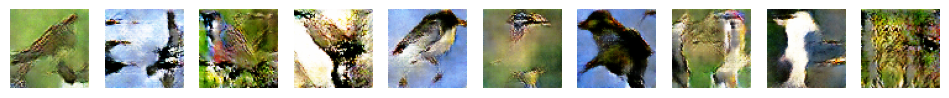

[ 41/500][165/165]	(eta: 00:01:02)	loss_d: 0.3486	loss_g: 2.5667	real_avg: 0.8256	fake_avg: 0.0996 / 0.13270
[ 42/500][165/165]	(eta: 00:01:06)	loss_d: 0.1397	loss_g: 1.8501	real_avg: 0.9111	fake_avg: 0.0162 / 0.31152
[ 43/500][165/165]	(eta: 00:01:06)	loss_d: 1.9481	loss_g: 10.6761	real_avg: 0.9995	fake_avg: 0.6672 / 0.0001
[ 44/500][165/165]	(eta: 00:01:06)	loss_d: 0.0908	loss_g: 4.7695	real_avg: 0.9465	fake_avg: 0.0283 / 0.02010
[ 45/500][165/165]	(eta: 00:01:05)	loss_d: 0.0966	loss_g: 4.3151	real_avg: 0.9525	fake_avg: 0.0351 / 0.03430
Examples generated for fixed noise:


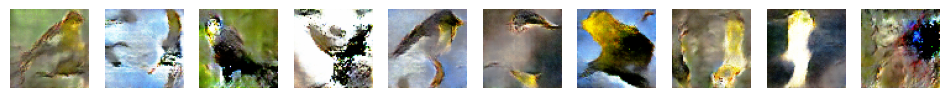

[ 46/500][165/165]	(eta: 00:01:02)	loss_d: 0.0945	loss_g: 4.4503	real_avg: 0.9565	fake_avg: 0.0417 / 0.02570
[ 47/500][165/165]	(eta: 00:01:06)	loss_d: 0.0447	loss_g: 4.8183	real_avg: 0.9665	fake_avg: 0.0077 / 0.02542
[ 48/500][165/165]	(eta: 00:01:05)	loss_d: 2.6723	loss_g: 10.5933	real_avg: 0.9990	fake_avg: 0.8213 / 0.0001
[ 49/500][165/165]	(eta: 00:01:06)	loss_d: 0.0794	loss_g: 5.2366	real_avg: 0.9952	fake_avg: 0.0656 / 0.01212
[ 50/500][165/165]	(eta: 00:01:05)	loss_d: 0.1051	loss_g: 4.3261	real_avg: 0.9754	fake_avg: 0.0693 / 0.02542
Generator saved to: './models/gen_gl=4.751663684844971_dl=0.18340197205543518_e=51_t=1685455618.pth'
Discriminator saved to: './models/dis_gl=4.751663684844971_dl=0.18340197205543518_e=51_t=1685455618.pth'
Examples generated for fixed noise:


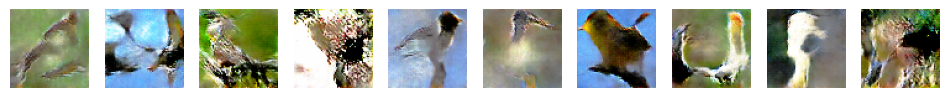

[ 51/500][165/165]	(eta: 00:01:02)	loss_d: 0.1652	loss_g: 5.2029	real_avg: 0.8783	fake_avg: 0.0021 / 0.03520
[ 52/500][165/165]	(eta: 00:01:06)	loss_d: 0.0394	loss_g: 5.7470	real_avg: 0.9720	fake_avg: 0.0094 / 0.00772
[ 53/500][165/165]	(eta: 00:01:06)	loss_d: 0.0021	loss_g: 7.5760	real_avg: 0.9999	fake_avg: 0.0020 / 0.00212
[ 54/500][165/165]	(eta: 00:01:06)	loss_d: 0.0181	loss_g: 7.6615	real_avg: 0.9997	fake_avg: 0.0171 / 0.00160
[ 55/500][165/165]	(eta: 00:01:05)	loss_d: 0.1997	loss_g: 3.0375	real_avg: 0.8758	fake_avg: 0.0488 / 0.09280
Examples generated for fixed noise:


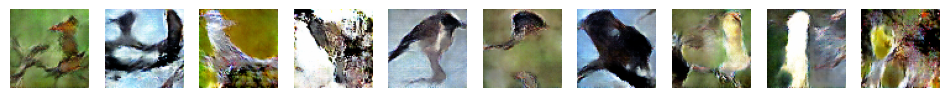

[ 56/500][165/165]	(eta: 00:01:02)	loss_d: 3.0213	loss_g: 3.3406	real_avg: 0.1039	fake_avg: 0.0005 / 0.05081
[ 57/500][165/165]	(eta: 00:01:05)	loss_d: 0.0624	loss_g: 5.4926	real_avg: 0.9728	fake_avg: 0.0285 / 0.01071
[ 58/500][165/165]	(eta: 00:01:07)	loss_d: 0.0874	loss_g: 5.6060	real_avg: 0.9914	fake_avg: 0.0676 / 0.01150
[ 59/500][165/165]	(eta: 00:01:06)	loss_d: 0.0594	loss_g: 6.1477	real_avg: 0.9785	fake_avg: 0.0313 / 0.00810
[ 60/500][165/165]	(eta: 00:01:06)	loss_d: 0.2576	loss_g: 3.0219	real_avg: 0.8108	fake_avg: 0.0042 / 0.09700
Generator saved to: './models/gen_gl=6.563023567199707_dl=0.14406991004943848_e=61_t=1685456306.pth'
Discriminator saved to: './models/dis_gl=6.563023567199707_dl=0.14406991004943848_e=61_t=1685456306.pth'
Examples generated for fixed noise:


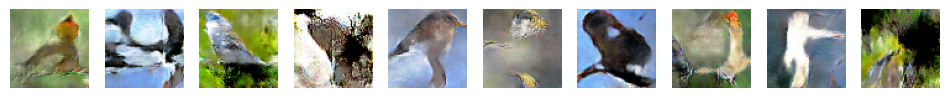

[ 61/500][165/165]	(eta: 00:01:02)	loss_d: 0.0685	loss_g: 4.3282	real_avg: 0.9561	fake_avg: 0.0174 / 0.04540
[ 62/500][165/165]	(eta: 00:01:06)	loss_d: 0.0528	loss_g: 5.9850	real_avg: 0.9977	fake_avg: 0.0457 / 0.00620
[ 63/500][165/165]	(eta: 00:01:06)	loss_d: 0.0428	loss_g: 5.3274	real_avg: 0.9950	fake_avg: 0.0346 / 0.01470
[ 64/500][165/165]	(eta: 00:01:05)	loss_d: 0.0375	loss_g: 4.8911	real_avg: 0.9813	fake_avg: 0.0151 / 0.01521
[ 65/500][165/165]	(eta: 00:01:06)	loss_d: 0.2200	loss_g: 7.9901	real_avg: 0.9999	fake_avg: 0.1621 / 0.00132
Examples generated for fixed noise:


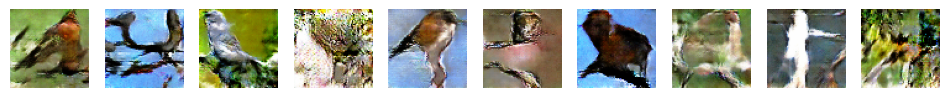

[ 66/500][165/165]	(eta: 00:01:02)	loss_d: 0.0510	loss_g: 4.4926	real_avg: 0.9966	fake_avg: 0.0455 / 0.02392
[ 67/500][165/165]	(eta: 00:01:05)	loss_d: 0.0342	loss_g: 4.9786	real_avg: 0.9907	fake_avg: 0.0237 / 0.01610
[ 68/500][165/165]	(eta: 00:01:05)	loss_d: 0.1657	loss_g: 3.5750	real_avg: 0.9506	fake_avg: 0.0976 / 0.05321
[ 69/500][165/165]	(eta: 00:01:06)	loss_d: 0.2737	loss_g: 2.5760	real_avg: 0.8383	fake_avg: 0.0717 / 0.12672
[ 70/500][165/165]	(eta: 00:01:06)	loss_d: 0.2615	loss_g: 8.8919	real_avg: 0.9994	fake_avg: 0.1878 / 0.00060
Generator saved to: './models/gen_gl=0.5523399710655212_dl=0.8676853179931641_e=71_t=1685456994.pth'
Discriminator saved to: './models/dis_gl=0.5523399710655212_dl=0.8676853179931641_e=71_t=1685456994.pth'
Examples generated for fixed noise:


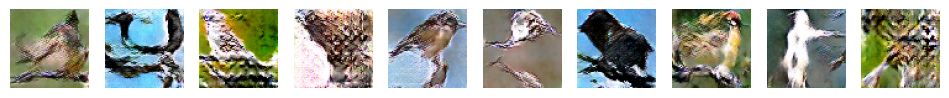

[ 71/500][165/165]	(eta: 00:01:02)	loss_d: 0.1268	loss_g: 4.1532	real_avg: 0.9013	fake_avg: 0.0086 / 0.04431
[ 72/500][165/165]	(eta: 00:01:06)	loss_d: 0.4275	loss_g: 4.5995	real_avg: 0.9941	fake_avg: 0.2775 / 0.01970
[ 73/500][165/165]	(eta: 00:01:06)	loss_d: 0.3428	loss_g: 3.0156	real_avg: 0.9347	fake_avg: 0.2159 / 0.08001
[ 74/500][165/165]	(eta: 00:01:06)	loss_d: 0.1418	loss_g: 7.7242	real_avg: 0.9980	fake_avg: 0.1001 / 0.00131
[ 75/500][165/165]	(eta: 00:01:06)	loss_d: 0.0808	loss_g: 7.4202	real_avg: 0.9999	fake_avg: 0.0681 / 0.00270
Examples generated for fixed noise:


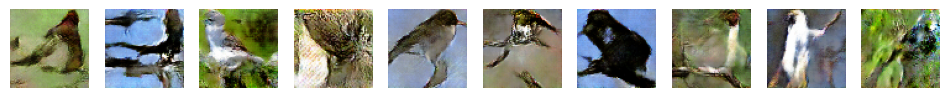

[ 76/500][165/165]	(eta: 00:01:02)	loss_d: 2.3145	loss_g: 10.4100	real_avg: 1.0000	fake_avg: 0.7297 / 0.0001
[ 77/500][165/165]	(eta: 00:01:05)	loss_d: 0.0121	loss_g: 6.3897	real_avg: 1.0000	fake_avg: 0.0118 / 0.00532
[ 78/500][165/165]	(eta: 00:01:05)	loss_d: 8.0756	loss_g: 7.8275	real_avg: 0.0024	fake_avg: 0.0000 / 0.00170
[ 79/500][165/165]	(eta: 00:01:06)	loss_d: 0.0079	loss_g: 7.1928	real_avg: 0.9981	fake_avg: 0.0059 / 0.00311
[ 80/500][165/165]	(eta: 00:01:06)	loss_d: 0.0032	loss_g: 7.1805	real_avg: 0.9996	fake_avg: 0.0028 / 0.00211
Generator saved to: './models/gen_gl=8.262044906616211_dl=0.0019176575588062406_e=81_t=1685457682.pth'
Discriminator saved to: './models/dis_gl=8.262044906616211_dl=0.0019176575588062406_e=81_t=1685457682.pth'
Examples generated for fixed noise:


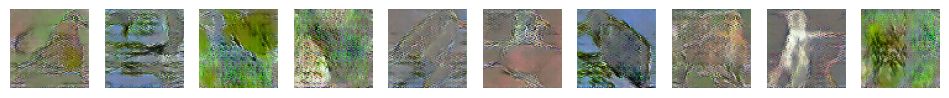

[ 81/500][165/165]	(eta: 00:01:02)	loss_d: 0.2619	loss_g: 5.6515	real_avg: 0.9642	fake_avg: 0.1647 / 0.00861
[ 82/500][165/165]	(eta: 00:01:06)	loss_d: 0.1795	loss_g: 2.3139	real_avg: 0.9245	fake_avg: 0.0781 / 0.17270
[ 83/500][165/165]	(eta: 00:01:06)	loss_d: 0.3665	loss_g: 2.9166	real_avg: 0.8438	fake_avg: 0.1428 / 0.09840
[ 84/500][165/165]	(eta: 00:01:05)	loss_d: 0.3998	loss_g: 6.6311	real_avg: 0.9998	fake_avg: 0.2536 / 0.00431
[ 85/500][165/165]	(eta: 00:01:06)	loss_d: 0.6776	loss_g: 9.9949	real_avg: 0.9999	fake_avg: 0.3719 / 0.00060
Examples generated for fixed noise:


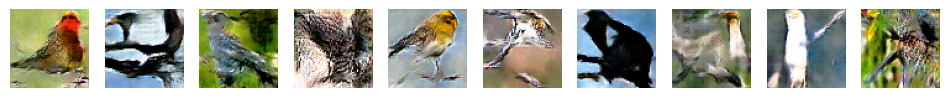

[ 86/500][165/165]	(eta: 00:01:02)	loss_d: 0.0131	loss_g: 5.4857	real_avg: 0.9996	fake_avg: 0.0125 / 0.01211
[ 87/500][165/165]	(eta: 00:01:06)	loss_d: 0.0316	loss_g: 5.9439	real_avg: 0.9772	fake_avg: 0.0027 / 0.00871
[ 88/500][165/165]	(eta: 00:01:06)	loss_d: 0.0842	loss_g: 5.3278	real_avg: 0.9711	fake_avg: 0.0461 / 0.02271
[ 89/500][165/165]	(eta: 00:01:05)	loss_d: 0.0049	loss_g: 7.7546	real_avg: 1.0000	fake_avg: 0.0048 / 0.00264
[ 90/500][165/165]	(eta: 00:01:06)	loss_d: 0.0084	loss_g: 8.1779	real_avg: 0.9970	fake_avg: 0.0050 / 0.001620
Generator saved to: './models/gen_gl=6.527107238769531_dl=0.03969832509756088_e=91_t=1685458370.pth'
Discriminator saved to: './models/dis_gl=6.527107238769531_dl=0.03969832509756088_e=91_t=1685458370.pth'
Examples generated for fixed noise:


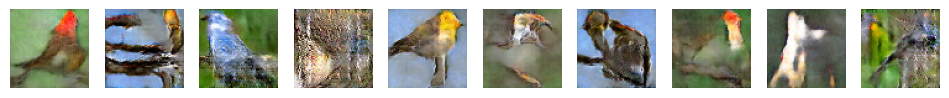

[ 91/500][165/165]	(eta: 00:01:02)	loss_d: 0.0516	loss_g: 4.7639	real_avg: 0.9850	fake_avg: 0.0200 / 0.03230
[ 92/500][165/165]	(eta: 00:01:06)	loss_d: 0.5600	loss_g: 6.4736	real_avg: 0.9996	fake_avg: 0.3078 / 0.00442
[ 93/500][165/165]	(eta: 00:01:06)	loss_d: 0.0505	loss_g: 4.8159	real_avg: 0.9976	fake_avg: 0.0401 / 0.02460
[ 94/500][165/165]	(eta: 00:01:06)	loss_d: 0.0215	loss_g: 5.4946	real_avg: 0.9920	fake_avg: 0.0130 / 0.01500
[ 95/500][165/165]	(eta: 00:01:06)	loss_d: 0.0991	loss_g: 7.2222	real_avg: 0.9965	fake_avg: 0.0401 / 0.00280
Examples generated for fixed noise:


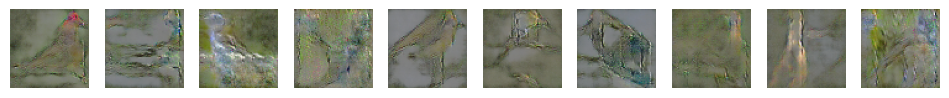

[ 96/500][165/165]	(eta: 00:01:02)	loss_d: 0.1489	loss_g: 3.8552	real_avg: 0.9091	fake_avg: 0.0311 / 0.03980
[ 97/500][165/165]	(eta: 00:01:06)	loss_d: 0.0157	loss_g: 5.6802	real_avg: 0.9902	fake_avg: 0.0052 / 0.00912
[ 98/500][165/165]	(eta: 00:01:06)	loss_d: 0.5212	loss_g: 6.1584	real_avg: 0.9950	fake_avg: 0.3195 / 0.00780
[ 99/500][165/165]	(eta: 00:01:06)	loss_d: 0.1362	loss_g: 10.0127	real_avg: 0.9999	fake_avg: 0.1049 / 0.0003
[100/500][165/165]	(eta: 00:01:06)	loss_d: 0.0871	loss_g: 3.0517	real_avg: 0.9411	fake_avg: 0.0014 / 0.12170
Generator saved to: './models/gen_gl=12.549895286560059_dl=0.34803441166877747_e=101_t=1685459059.pth'
Discriminator saved to: './models/dis_gl=12.549895286560059_dl=0.34803441166877747_e=101_t=1685459059.pth'
Examples generated for fixed noise:


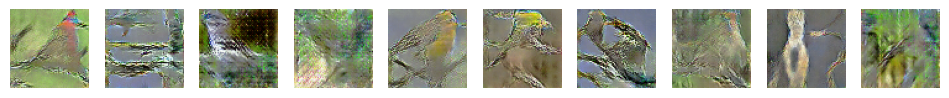

[101/500][165/165]	(eta: 00:01:02)	loss_d: 0.0010	loss_g: 8.8559	real_avg: 0.9994	fake_avg: 0.0004 / 0.00161
[102/500][165/165]	(eta: 00:01:06)	loss_d: 0.0022	loss_g: 7.6382	real_avg: 0.9998	fake_avg: 0.0021 / 0.00162
[103/500][165/165]	(eta: 00:01:05)	loss_d: 0.3019	loss_g: 4.2094	real_avg: 0.9896	fake_avg: 0.2243 / 0.03440
[104/500][165/165]	(eta: 00:01:07)	loss_d: 0.0524	loss_g: 5.5715	real_avg: 0.9679	fake_avg: 0.0155 / 0.01041
[105/500][165/165]	(eta: 00:01:06)	loss_d: 0.0052	loss_g: 7.8143	real_avg: 1.0000	fake_avg: 0.0050 / 0.00330
Examples generated for fixed noise:


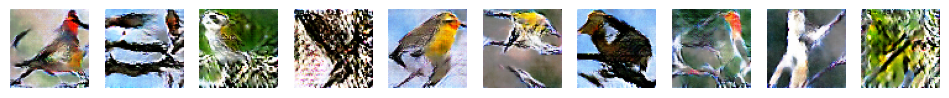

[106/500][165/165]	(eta: 00:01:02)	loss_d: 0.1599	loss_g: 4.3097	real_avg: 0.9015	fake_avg: 0.0122 / 0.03151
[107/500][165/165]	(eta: 00:01:05)	loss_d: 1.1336	loss_g: 9.8926	real_avg: 1.0000	fake_avg: 0.4525 / 0.00031
[108/500][165/165]	(eta: 00:01:06)	loss_d: 0.0278	loss_g: 5.9009	real_avg: 0.9999	fake_avg: 0.0263 / 0.00670
[109/500][165/165]	(eta: 00:01:06)	loss_d: 0.0084	loss_g: 5.7754	real_avg: 0.9973	fake_avg: 0.0057 / 0.00761
[110/500][165/165]	(eta: 00:01:07)	loss_d: 0.2461	loss_g: 3.7069	real_avg: 0.8682	fake_avg: 0.0355 / 0.07150
Generator saved to: './models/gen_gl=7.394561767578125_dl=0.2033548355102539_e=111_t=1685459748.pth'
Discriminator saved to: './models/dis_gl=7.394561767578125_dl=0.2033548355102539_e=111_t=1685459748.pth'
Examples generated for fixed noise:


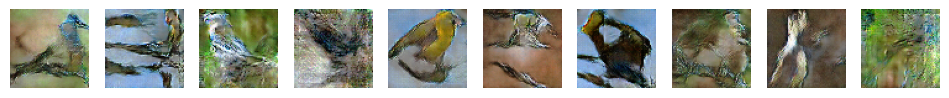

[111/500][165/165]	(eta: 00:01:02)	loss_d: 0.0211	loss_g: 5.3794	real_avg: 0.9936	fake_avg: 0.0142 / 0.01091
[112/500][165/165]	(eta: 00:01:06)	loss_d: 0.0398	loss_g: 6.7277	real_avg: 0.9966	fake_avg: 0.0325 / 0.00500
[113/500][165/165]	(eta: 00:01:06)	loss_d: 0.3585	loss_g: 6.6198	real_avg: 0.9998	fake_avg: 0.2135 / 0.00494
[114/500][165/165]	(eta: 00:01:06)	loss_d: 0.1277	loss_g: 11.0848	real_avg: 0.9995	fake_avg: 0.0914 / 0.0001
[115/500][165/165]	(eta: 00:01:06)	loss_d: 0.0469	loss_g: 6.3905	real_avg: 0.9999	fake_avg: 0.0398 / 0.00830
Examples generated for fixed noise:


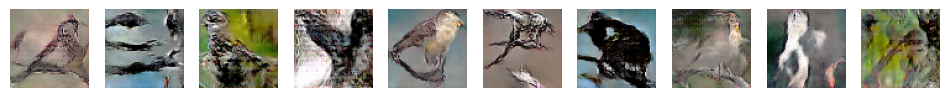

[116/500][165/165]	(eta: 00:01:02)	loss_d: 0.1257	loss_g: 4.8984	real_avg: 0.9967	fake_avg: 0.1077 / 0.01990
[117/500][165/165]	(eta: 00:01:06)	loss_d: 0.0259	loss_g: 6.3292	real_avg: 0.9988	fake_avg: 0.0232 / 0.00681
[118/500][165/165]	(eta: 00:01:06)	loss_d: 0.0026	loss_g: 7.4813	real_avg: 0.9995	fake_avg: 0.0021 / 0.00263
[119/500][165/165]	(eta: 00:01:06)	loss_d: 0.0562	loss_g: 10.9065	real_avg: 0.9889	fake_avg: 0.0305 / 0.0006
[120/500][165/165]	(eta: 00:01:08)	loss_d: 0.0005	loss_g: 9.6194	real_avg: 0.9999	fake_avg: 0.0004 / 0.00062
Generator saved to: './models/gen_gl=10.38051986694336_dl=0.00935997162014246_e=121_t=1685460440.pth'
Discriminator saved to: './models/dis_gl=10.38051986694336_dl=0.00935997162014246_e=121_t=1685460440.pth'
Examples generated for fixed noise:


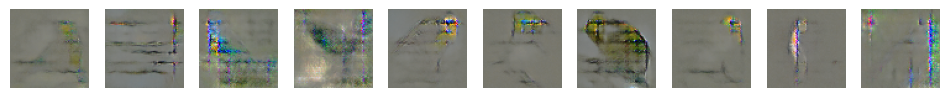

[121/500][165/165]	(eta: 00:01:02)	loss_d: 0.0724	loss_g: 5.7279	real_avg: 0.9450	fake_avg: 0.0081 / 0.01094
[122/500][165/165]	(eta: 00:01:07)	loss_d: 0.2369	loss_g: 3.8528	real_avg: 0.8342	fake_avg: 0.0230 / 0.04960
[123/500][165/165]	(eta: 00:01:05)	loss_d: 0.0070	loss_g: 6.1299	real_avg: 0.9999	fake_avg: 0.0068 / 0.00610
[124/500][165/165]	(eta: 00:01:06)	loss_d: 0.3378	loss_g: 4.7484	real_avg: 0.7801	fake_avg: 0.0011 / 0.02530
[125/500][165/165]	(eta: 00:01:06)	loss_d: 0.0216	loss_g: 7.0078	real_avg: 0.9936	fake_avg: 0.0141 / 0.00383
Examples generated for fixed noise:


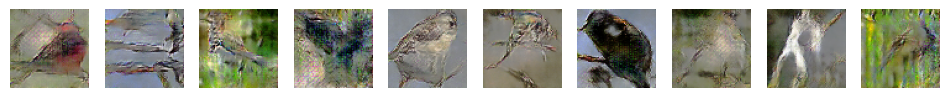

[126/500][165/165]	(eta: 00:01:02)	loss_d: 0.0863	loss_g: 6.8398	real_avg: 0.9937	fake_avg: 0.0675 / 0.00351
[127/500][165/165]	(eta: 00:01:08)	loss_d: 0.0062	loss_g: 8.7746	real_avg: 0.9987	fake_avg: 0.0047 / 0.00090
[128/500][165/165]	(eta: 00:01:06)	loss_d: 0.0788	loss_g: 5.9237	real_avg: 0.9444	fake_avg: 0.0011 / 0.00920
[129/500][165/165]	(eta: 00:01:09)	loss_d: 0.0121	loss_g: 6.4863	real_avg: 0.9953	fake_avg: 0.0072 / 0.00690
[130/500][165/165]	(eta: 00:01:08)	loss_d: 0.0166	loss_g: 6.0966	real_avg: 0.9967	fake_avg: 0.0130 / 0.00760
Generator saved to: './models/gen_gl=6.424762725830078_dl=0.010062565095722675_e=131_t=1685461140.pth'
Discriminator saved to: './models/dis_gl=6.424762725830078_dl=0.010062565095722675_e=131_t=1685461140.pth'
Examples generated for fixed noise:


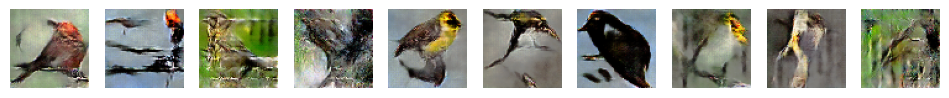

[131/500][165/165]	(eta: 00:01:04)	loss_d: 0.9825	loss_g: 19.5649	real_avg: 1.0000	fake_avg: 0.3901 / 0.0000
[132/500][165/165]	(eta: 00:01:08)	loss_d: 0.5918	loss_g: 0.9454	real_avg: 0.6400	fake_avg: 0.0184 / 0.54691
[133/500][165/165]	(eta: 00:01:08)	loss_d: 0.0133	loss_g: 5.9987	real_avg: 0.9987	fake_avg: 0.0118 / 0.00710
[134/500][165/165]	(eta: 00:01:06)	loss_d: 0.0005	loss_g: 10.3193	real_avg: 0.9998	fake_avg: 0.0002 / 0.0003
[135/500][165/165]	(eta: 00:01:06)	loss_d: 0.0038	loss_g: 7.4311	real_avg: 0.9991	fake_avg: 0.0029 / 0.00260
Examples generated for fixed noise:


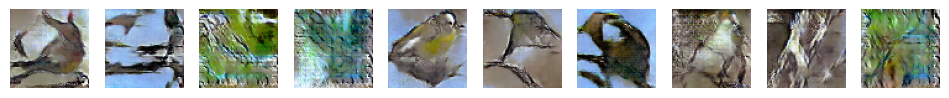

[136/500][165/165]	(eta: 00:01:02)	loss_d: 0.0108	loss_g: 7.0797	real_avg: 0.9966	fake_avg: 0.0071 / 0.002103
[137/500][165/165]	(eta: 00:01:06)	loss_d: 0.0196	loss_g: 6.2991	real_avg: 0.9977	fake_avg: 0.0168 / 0.00800
[138/500][165/165]	(eta: 00:01:05)	loss_d: 2.1528	loss_g: 10.8666	real_avg: 0.9996	fake_avg: 0.6590 / 0.0001
[139/500][165/165]	(eta: 00:01:05)	loss_d: 0.0488	loss_g: 6.3410	real_avg: 0.9968	fake_avg: 0.0379 / 0.00561
[140/500][165/165]	(eta: 00:01:06)	loss_d: 0.0114	loss_g: 6.3864	real_avg: 0.9983	fake_avg: 0.0094 / 0.00810
Generator saved to: './models/gen_gl=7.103410720825195_dl=0.012882431037724018_e=141_t=1685461835.pth'
Discriminator saved to: './models/dis_gl=7.103410720825195_dl=0.012882431037724018_e=141_t=1685461835.pth'
Examples generated for fixed noise:


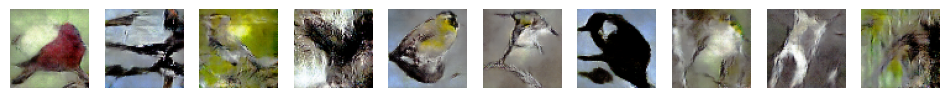

[141/500][165/165]	(eta: 00:01:02)	loss_d: 0.0748	loss_g: 5.6394	real_avg: 0.9536	fake_avg: 0.0044 / 0.01983
[142/500][165/165]	(eta: 00:01:06)	loss_d: 0.0015	loss_g: 8.2702	real_avg: 1.0000	fake_avg: 0.0014 / 0.00120
[143/500][165/165]	(eta: 00:01:05)	loss_d: 4.9709	loss_g: 10.2189	real_avg: 1.0000	fake_avg: 0.9560 / 0.0005
[144/500][165/165]	(eta: 00:01:05)	loss_d: 0.1623	loss_g: 3.5952	real_avg: 0.9498	fake_avg: 0.0916 / 0.04662
[145/500][165/165]	(eta: 00:01:05)	loss_d: 0.0023	loss_g: 7.3593	real_avg: 0.9994	fake_avg: 0.0017 / 0.00281
Examples generated for fixed noise:


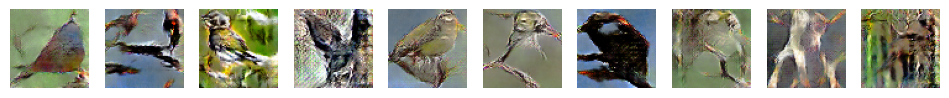

[146/500][165/165]	(eta: 00:01:02)	loss_d: 0.0393	loss_g: 6.4169	real_avg: 0.9997	fake_avg: 0.0360 / 0.004310
[147/500][165/165]	(eta: 00:01:06)	loss_d: 0.4234	loss_g: 0.7425	real_avg: 0.7659	fake_avg: 0.0147 / 0.68493
[148/500][165/165]	(eta: 00:01:06)	loss_d: 0.0027	loss_g: 8.5566	real_avg: 1.0000	fake_avg: 0.0026 / 0.00114
[149/500][165/165]	(eta: 00:01:05)	loss_d: 0.0545	loss_g: 7.5707	real_avg: 0.9562	fake_avg: 0.0032 / 0.00260
[150/500][165/165]	(eta: 00:01:05)	loss_d: 0.0005	loss_g: 11.3327	real_avg: 0.9998	fake_avg: 0.0004 / 0.0001
Generator saved to: './models/gen_gl=10.412099838256836_dl=0.0005299733020365238_e=151_t=1685462523.pth'
Discriminator saved to: './models/dis_gl=10.412099838256836_dl=0.0005299733020365238_e=151_t=1685462523.pth'
Examples generated for fixed noise:


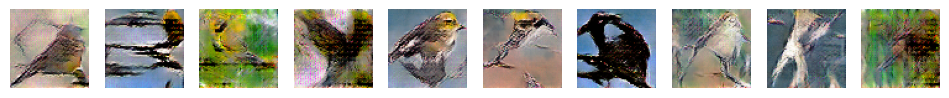

[151/500][165/165]	(eta: 00:01:02)	loss_d: 0.0121	loss_g: 6.6410	real_avg: 0.9992	fake_avg: 0.0111 / 0.010000
[152/500][165/165]	(eta: 00:01:06)	loss_d: 0.0017	loss_g: 8.0010	real_avg: 0.9999	fake_avg: 0.0016 / 0.00132
[153/500][165/165]	(eta: 00:01:05)	loss_d: 0.0395	loss_g: 6.7178	real_avg: 0.9997	fake_avg: 0.0357 / 0.00371
[154/500][165/165]	(eta: 00:01:06)	loss_d: 0.1151	loss_g: 6.1794	real_avg: 0.9480	fake_avg: 0.0443 / 0.02117
[155/500][165/165]	(eta: 00:01:06)	loss_d: 0.0305	loss_g: 7.8665	real_avg: 0.9995	fake_avg: 0.0269 / 0.00232
Examples generated for fixed noise:


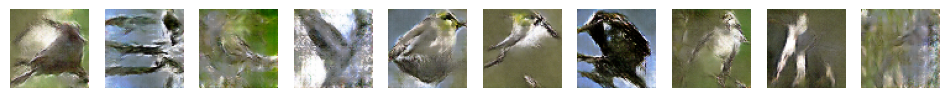

[156/500][165/165]	(eta: 00:01:02)	loss_d: 0.0704	loss_g: 5.5957	real_avg: 0.9705	fake_avg: 0.0336 / 0.010401
[157/500][165/165]	(eta: 00:01:06)	loss_d: 0.7305	loss_g: 12.0037	real_avg: 1.0000	fake_avg: 0.3235 / 0.0001
[158/500][165/165]	(eta: 00:01:05)	loss_d: 0.0114	loss_g: 6.6009	real_avg: 0.9995	fake_avg: 0.0107 / 0.00450
[159/500][165/165]	(eta: 00:01:06)	loss_d: 0.3907	loss_g: 3.5528	real_avg: 0.7733	fake_avg: 0.0126 / 0.06771
[160/500][165/165]	(eta: 00:01:05)	loss_d: 0.0027	loss_g: 7.4788	real_avg: 0.9999	fake_avg: 0.0026 / 0.00221
Generator saved to: './models/gen_gl=8.814899444580078_dl=0.003493941854685545_e=161_t=1685463211.pth'
Discriminator saved to: './models/dis_gl=8.814899444580078_dl=0.003493941854685545_e=161_t=1685463211.pth'
Examples generated for fixed noise:


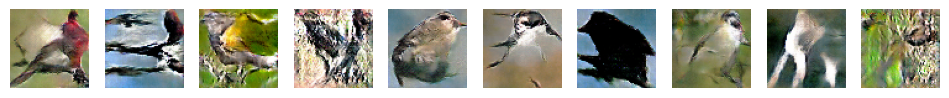

[161/500][165/165]	(eta: 00:01:02)	loss_d: 0.0029	loss_g: 8.0319	real_avg: 0.9993	fake_avg: 0.0022 / 0.00173
[162/500][165/165]	(eta: 00:01:06)	loss_d: 1.2392	loss_g: 7.4944	real_avg: 0.4664	fake_avg: 0.0001 / 0.00261
[163/500][165/165]	(eta: 00:01:06)	loss_d: 0.0939	loss_g: 7.1823	real_avg: 1.0000	fake_avg: 0.0763 / 0.00550
[164/500][165/165]	(eta: 00:01:06)	loss_d: 0.0027	loss_g: 9.0859	real_avg: 1.0000	fake_avg: 0.0026 / 0.00132
[165/500][165/165]	(eta: 00:01:05)	loss_d: 0.0016	loss_g: 8.5516	real_avg: 0.9999	fake_avg: 0.0015 / 0.00082
Examples generated for fixed noise:


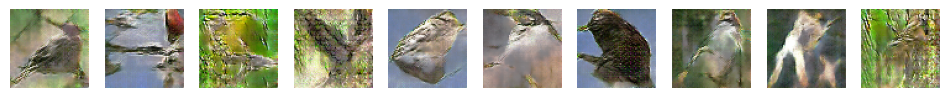

[166/500][165/165]	(eta: 00:01:02)	loss_d: 0.1039	loss_g: 4.3696	real_avg: 0.9363	fake_avg: 0.0234 / 0.03661
[167/500][165/165]	(eta: 00:01:06)	loss_d: 0.0221	loss_g: 6.0663	real_avg: 0.9930	fake_avg: 0.0137 / 0.01790
[168/500][165/165]	(eta: 00:01:06)	loss_d: 0.0011	loss_g: 9.2445	real_avg: 0.9998	fake_avg: 0.0009 / 0.00062
[169/500][165/165]	(eta: 00:01:06)	loss_d: 0.0402	loss_g: 6.8756	real_avg: 0.9659	fake_avg: 0.0002 / 0.008210
[170/500][165/165]	(eta: 00:01:05)	loss_d: 0.1250	loss_g: 2.1305	real_avg: 0.9336	fake_avg: 0.0055 / 0.39847
Generator saved to: './models/gen_gl=18.607921600341797_dl=1.5511878728866577_e=171_t=1685463898.pth'
Discriminator saved to: './models/dis_gl=18.607921600341797_dl=1.5511878728866577_e=171_t=1685463898.pth'
Examples generated for fixed noise:


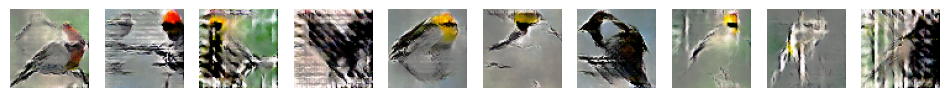

[171/500][165/165]	(eta: 00:01:02)	loss_d: 0.1022	loss_g: 4.6026	real_avg: 0.9413	fake_avg: 0.0288 / 0.02900
[172/500][165/165]	(eta: 00:01:05)	loss_d: 0.3207	loss_g: 12.1038	real_avg: 1.0000	fake_avg: 0.1803 / 0.0002
[173/500][165/165]	(eta: 00:01:06)	loss_d: 0.0020	loss_g: 8.8020	real_avg: 0.9985	fake_avg: 0.0004 / 0.00342
[174/500][165/165]	(eta: 00:01:06)	loss_d: 0.0787	loss_g: 7.4757	real_avg: 0.9341	fake_avg: 0.0025 / 0.00290
[175/500][165/165]	(eta: 00:01:06)	loss_d: 1.1320	loss_g: 1.4709	real_avg: 0.5489	fake_avg: 0.0021 / 0.42920
Examples generated for fixed noise:


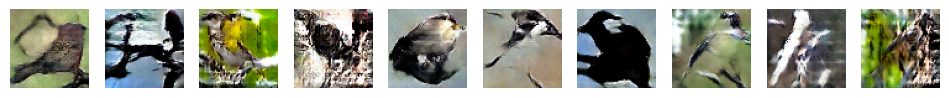

[176/500][165/165]	(eta: 00:01:02)	loss_d: 0.0001	loss_g: 11.4370	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
[177/500][165/165]	(eta: 00:01:06)	loss_d: 0.0089	loss_g: 6.5855	real_avg: 0.9994	fake_avg: 0.0080 / 0.00782
[178/500][165/165]	(eta: 00:01:07)	loss_d: 0.1770	loss_g: 16.9222	real_avg: 0.9992	fake_avg: 0.1102 / 0.0000
[179/500][165/165]	(eta: 00:01:07)	loss_d: 0.0159	loss_g: 10.9870	real_avg: 0.9862	fake_avg: 0.0002 / 0.0004
[180/500][165/165]	(eta: 00:01:09)	loss_d: 0.0173	loss_g: 6.2718	real_avg: 0.9971	fake_avg: 0.0139 / 0.01263
Generator saved to: './models/gen_gl=7.1713151931762695_dl=0.005637191701680422_e=181_t=1685464592.pth'
Discriminator saved to: './models/dis_gl=7.1713151931762695_dl=0.005637191701680422_e=181_t=1685464592.pth'
Examples generated for fixed noise:


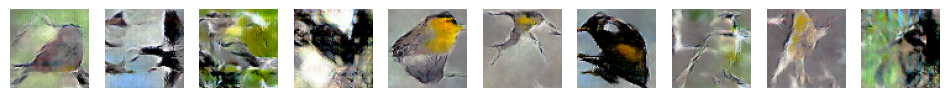

[181/500][165/165]	(eta: 00:01:05)	loss_d: 0.2460	loss_g: 10.1614	real_avg: 1.0000	fake_avg: 0.1663 / 0.0003
[182/500][165/165]	(eta: 00:01:07)	loss_d: 2.3472	loss_g: 11.3672	real_avg: 0.9995	fake_avg: 0.7159 / 0.0001
[183/500][165/165]	(eta: 00:01:08)	loss_d: 0.0047	loss_g: 6.6340	real_avg: 0.9959	fake_avg: 0.0004 / 0.00561
[184/500][165/165]	(eta: 00:01:07)	loss_d: 0.0035	loss_g: 7.6179	real_avg: 0.9995	fake_avg: 0.0029 / 0.00423
[185/500][165/165]	(eta: 00:01:08)	loss_d: 0.7332	loss_g: 1.5615	real_avg: 0.5995	fake_avg: 0.0404 / 0.31860
Examples generated for fixed noise:


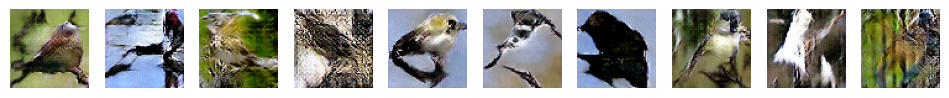

[186/500][165/165]	(eta: 00:01:02)	loss_d: 0.0119	loss_g: 6.2492	real_avg: 0.9909	fake_avg: 0.0025 / 0.008200
[187/500][165/165]	(eta: 00:01:06)	loss_d: 0.0050	loss_g: 8.0179	real_avg: 0.9981	fake_avg: 0.0030 / 0.00140
[188/500][165/165]	(eta: 00:01:05)	loss_d: 0.0019	loss_g: 8.9031	real_avg: 0.9998	fake_avg: 0.0017 / 0.00113
[189/500][165/165]	(eta: 00:01:05)	loss_d: 0.1631	loss_g: 4.0751	real_avg: 0.9107	fake_avg: 0.0518 / 0.03880
[190/500][165/165]	(eta: 00:01:06)	loss_d: 0.0293	loss_g: 4.1255	real_avg: 0.9776	fake_avg: 0.0026 / 0.07301
Generator saved to: './models/gen_gl=8.611771583557129_dl=0.012858091853559017_e=191_t=1685465291.pth'
Discriminator saved to: './models/dis_gl=8.611771583557129_dl=0.012858091853559017_e=191_t=1685465291.pth'
Examples generated for fixed noise:


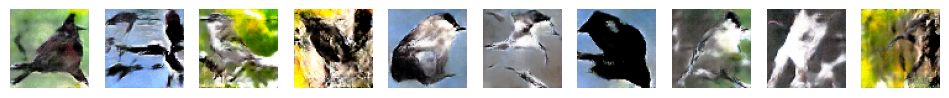

[191/500][165/165]	(eta: 00:01:02)	loss_d: 0.0157	loss_g: 7.1981	real_avg: 0.9980	fake_avg: 0.0131 / 0.00521
[192/500][165/165]	(eta: 00:01:06)	loss_d: 0.0204	loss_g: 11.1956	real_avg: 0.9874	fake_avg: 0.0001 / 0.0002
[193/500][165/165]	(eta: 00:01:05)	loss_d: 0.1761	loss_g: 6.7984	real_avg: 1.0000	fake_avg: 0.1153 / 0.00470
[194/500][165/165]	(eta: 00:01:05)	loss_d: 0.0048	loss_g: 7.8490	real_avg: 0.9994	fake_avg: 0.0041 / 0.01182
[195/500][165/165]	(eta: 00:01:05)	loss_d: 0.0010	loss_g: 9.1695	real_avg: 1.0000	fake_avg: 0.0010 / 0.00093
Examples generated for fixed noise:


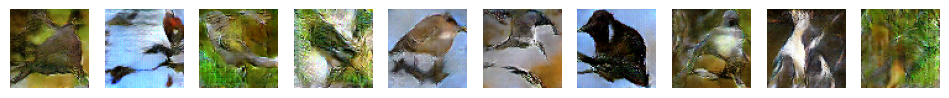

[196/500][165/165]	(eta: 00:01:02)	loss_d: 0.2742	loss_g: 6.3824	real_avg: 1.0000	fake_avg: 0.2059 / 0.00463
[197/500][165/165]	(eta: 00:01:06)	loss_d: 0.0012	loss_g: 9.8670	real_avg: 1.0000	fake_avg: 0.0012 / 0.00133
[198/500][165/165]	(eta: 00:01:06)	loss_d: 1.4114	loss_g: 6.8407	real_avg: 0.5513	fake_avg: 0.0000 / 0.02420
[199/500][165/165]	(eta: 00:01:06)	loss_d: 0.0178	loss_g: 6.9459	real_avg: 1.0000	fake_avg: 0.0160 / 0.00812
[200/500][165/165]	(eta: 00:01:06)	loss_d: 0.1149	loss_g: 4.5480	real_avg: 0.9999	fake_avg: 0.0802 / 0.06090
Generator saved to: './models/gen_gl=6.554012298583984_dl=0.13282181322574615_e=201_t=1685465980.pth'
Discriminator saved to: './models/dis_gl=6.554012298583984_dl=0.13282181322574615_e=201_t=1685465980.pth'
Examples generated for fixed noise:


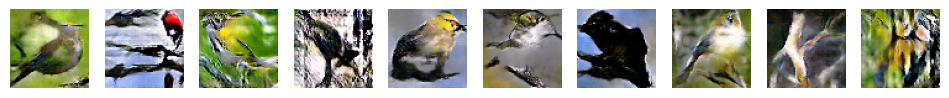

[201/500][165/165]	(eta: 00:01:03)	loss_d: 0.0293	loss_g: 6.4272	real_avg: 0.9987	fake_avg: 0.0241 / 0.01463
[202/500][165/165]	(eta: 00:01:06)	loss_d: 0.0523	loss_g: 3.6411	real_avg: 0.9732	fake_avg: 0.0227 / 0.08550
[203/500][165/165]	(eta: 00:01:06)	loss_d: 0.0229	loss_g: 6.2645	real_avg: 0.9995	fake_avg: 0.0208 / 0.007342
[204/500][165/165]	(eta: 00:01:06)	loss_d: 0.0066	loss_g: 8.3629	real_avg: 0.9997	fake_avg: 0.0056 / 0.00230
[205/500][165/165]	(eta: 00:01:06)	loss_d: 0.0245	loss_g: 7.6350	real_avg: 0.9988	fake_avg: 0.0209 / 0.00260
Examples generated for fixed noise:


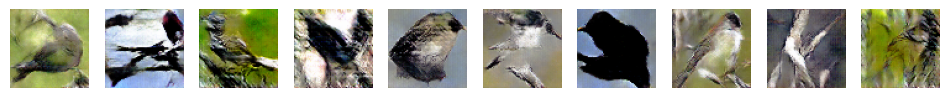

[206/500][165/165]	(eta: 00:01:02)	loss_d: 0.0081	loss_g: 10.0088	real_avg: 0.9999	fake_avg: 0.0076 / 0.00051
[207/500][165/165]	(eta: 00:01:06)	loss_d: 0.1253	loss_g: 7.2778	real_avg: 0.9998	fake_avg: 0.1017 / 0.007003
[208/500][165/165]	(eta: 00:01:07)	loss_d: 0.0586	loss_g: 7.9870	real_avg: 0.9999	fake_avg: 0.0339 / 0.00263
[209/500][165/165]	(eta: 00:01:06)	loss_d: 0.0275	loss_g: 6.4530	real_avg: 1.0000	fake_avg: 0.0247 / 0.03550
[210/500][165/165]	(eta: 00:01:06)	loss_d: 0.0023	loss_g: 9.7261	real_avg: 1.0000	fake_avg: 0.0023 / 0.00074
Generator saved to: './models/gen_gl=10.183571815490723_dl=0.000699169875588268_e=211_t=1685466672.pth'
Discriminator saved to: './models/dis_gl=10.183571815490723_dl=0.000699169875588268_e=211_t=1685466672.pth'
Examples generated for fixed noise:


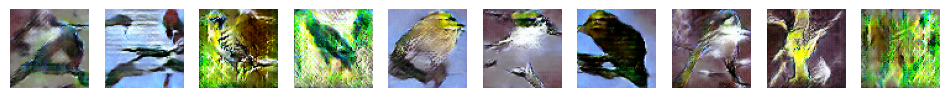

[211/500][165/165]	(eta: 00:01:02)	loss_d: 0.0068	loss_g: 8.1147	real_avg: 1.0000	fake_avg: 0.0067 / 0.00340
[212/500][165/165]	(eta: 00:01:06)	loss_d: 0.0180	loss_g: 8.6743	real_avg: 0.9995	fake_avg: 0.0165 / 0.00270
[213/500][165/165]	(eta: 00:01:06)	loss_d: 0.0011	loss_g: 9.3249	real_avg: 1.0000	fake_avg: 0.0011 / 0.01184
[214/500][165/165]	(eta: 00:01:07)	loss_d: 0.0003	loss_g: 13.3203	real_avg: 1.0000	fake_avg: 0.0003 / 0.0000
[215/500][165/165]	(eta: 00:01:06)	loss_d: 0.1219	loss_g: 6.0728	real_avg: 0.9752	fake_avg: 0.0634 / 0.018500
Examples generated for fixed noise:


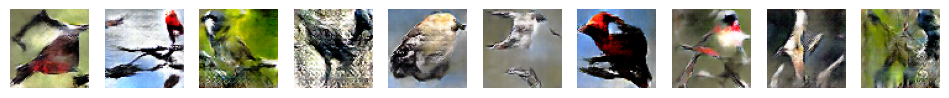

[216/500][165/165]	(eta: 00:01:03)	loss_d: 0.0477	loss_g: 6.1276	real_avg: 0.9673	fake_avg: 0.0115 / 0.01981
[217/500][165/165]	(eta: 00:01:05)	loss_d: 0.3858	loss_g: 5.8781	real_avg: 0.7393	fake_avg: 0.0005 / 0.00901
[218/500][165/165]	(eta: 00:01:06)	loss_d: 0.0006	loss_g: 10.5940	real_avg: 1.0000	fake_avg: 0.0006 / 0.0003
[219/500][165/165]	(eta: 00:01:06)	loss_d: 0.0059	loss_g: 8.2925	real_avg: 0.9998	fake_avg: 0.0056 / 0.00217
[220/500][165/165]	(eta: 00:01:06)	loss_d: 0.0263	loss_g: 21.4453	real_avg: 0.9798	fake_avg: 0.0000 / 0.0000
Generator saved to: './models/gen_gl=18.830636978149414_dl=8.828705904306844e-05_e=221_t=1685467364.pth'
Discriminator saved to: './models/dis_gl=18.830636978149414_dl=8.828705904306844e-05_e=221_t=1685467364.pth'
Examples generated for fixed noise:


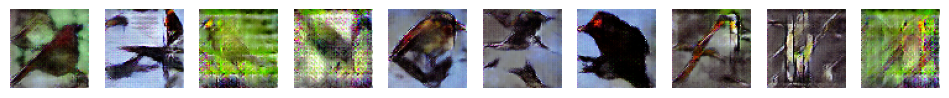

[221/500][165/165]	(eta: 00:01:02)	loss_d: 0.0291	loss_g: 5.9261	real_avg: 0.9993	fake_avg: 0.0263 / 0.00810
[222/500][165/165]	(eta: 00:01:06)	loss_d: 0.0000	loss_g: 14.9031	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
[223/500][165/165]	(eta: 00:01:06)	loss_d: 0.1397	loss_g: 5.4077	real_avg: 0.9997	fake_avg: 0.1149 / 0.02140
[224/500][165/165]	(eta: 00:01:06)	loss_d: 0.1108	loss_g: 5.3884	real_avg: 0.9975	fake_avg: 0.0906 / 0.01430
[225/500][165/165]	(eta: 00:01:07)	loss_d: 0.0000	loss_g: 12.7355	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
Examples generated for fixed noise:


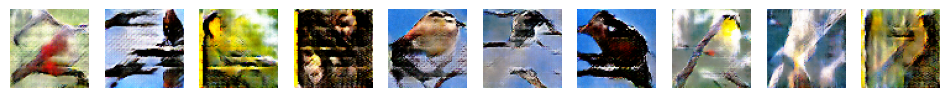

[226/500][165/165]	(eta: 00:01:02)	loss_d: 0.0016	loss_g: 9.9476	real_avg: 0.9992	fake_avg: 0.0008 / 0.001510
[227/500][165/165]	(eta: 00:01:06)	loss_d: 0.0105	loss_g: 9.3107	real_avg: 0.9925	fake_avg: 0.0025 / 0.00062
[228/500][165/165]	(eta: 00:01:06)	loss_d: 0.0124	loss_g: 8.1649	real_avg: 0.9904	fake_avg: 0.0018 / 0.00300
[229/500][165/165]	(eta: 00:01:06)	loss_d: 0.0356	loss_g: 7.9673	real_avg: 0.9762	fake_avg: 0.0083 / 0.00353
[230/500][165/165]	(eta: 00:01:05)	loss_d: 0.1790	loss_g: 3.0515	real_avg: 0.8925	fake_avg: 0.0007 / 0.16384
Generator saved to: './models/gen_gl=22.28451156616211_dl=3.348663806915283_e=231_t=1685468056.pth'
Discriminator saved to: './models/dis_gl=22.28451156616211_dl=3.348663806915283_e=231_t=1685468056.pth'
Examples generated for fixed noise:


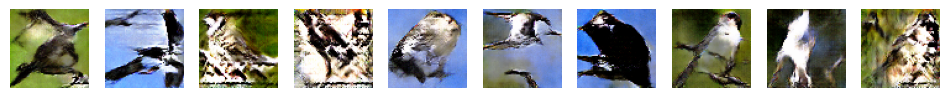

[231/500][165/165]	(eta: 00:01:03)	loss_d: 0.0049	loss_g: 7.2387	real_avg: 1.0000	fake_avg: 0.0048 / 0.00384
[232/500][165/165]	(eta: 00:01:06)	loss_d: 0.0028	loss_g: 8.6217	real_avg: 1.0000	fake_avg: 0.0027 / 0.00131
[233/500][165/165]	(eta: 00:01:10)	loss_d: 0.0001	loss_g: 12.0283	real_avg: 1.0000	fake_avg: 0.0001 / 0.0006
[234/500][165/165]	(eta: 00:01:05)	loss_d: 0.0394	loss_g: 13.7471	real_avg: 0.9694	fake_avg: 0.0000 / 0.00000
[235/500][165/165]	(eta: 00:01:06)	loss_d: 0.0035	loss_g: 7.8804	real_avg: 0.9999	fake_avg: 0.0034 / 0.00159
Examples generated for fixed noise:


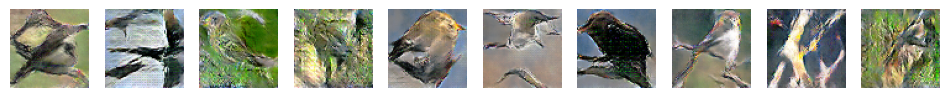

[236/500][165/165]	(eta: 00:01:02)	loss_d: 1.3048	loss_g: 24.5315	real_avg: 0.9990	fake_avg: 0.4864 / 0.00002
[237/500][165/165]	(eta: 00:01:06)	loss_d: 0.0621	loss_g: 5.9557	real_avg: 0.9530	fake_avg: 0.0070 / 0.01657
[238/500][165/165]	(eta: 00:01:05)	loss_d: 0.0438	loss_g: 6.7329	real_avg: 0.9769	fake_avg: 0.0106 / 0.01512
[239/500][165/165]	(eta: 00:01:06)	loss_d: 0.0005	loss_g: 10.6499	real_avg: 1.0000	fake_avg: 0.0005 / 0.0004
[240/500][165/165]	(eta: 00:01:06)	loss_d: 0.1960	loss_g: 9.5779	real_avg: 0.9998	fake_avg: 0.1361 / 0.00050
Generator saved to: './models/gen_gl=3.841404676437378_dl=1.2504788637161255_e=241_t=1685468745.pth'
Discriminator saved to: './models/dis_gl=3.841404676437378_dl=1.2504788637161255_e=241_t=1685468745.pth'
Examples generated for fixed noise:


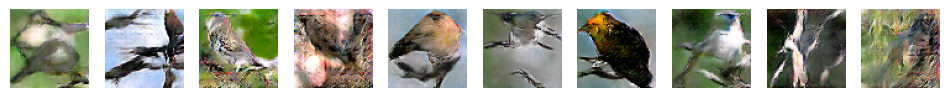

[241/500][165/165]	(eta: 00:01:02)	loss_d: 0.0001	loss_g: 12.4218	real_avg: 1.0000	fake_avg: 0.0001 / 0.0001
[242/500][165/165]	(eta: 00:01:06)	loss_d: 0.0582	loss_g: 7.9181	real_avg: 0.9928	fake_avg: 0.0377 / 0.00413
[243/500][165/165]	(eta: 00:01:05)	loss_d: 0.0003	loss_g: 11.6950	real_avg: 0.9998	fake_avg: 0.0001 / 0.0001
[244/500][165/165]	(eta: 00:01:06)	loss_d: 0.0042	loss_g: 8.8970	real_avg: 0.9965	fake_avg: 0.0006 / 0.00091
[245/500][165/165]	(eta: 00:01:05)	loss_d: 0.0479	loss_g: 6.2940	real_avg: 0.9650	fake_avg: 0.0081 / 0.01490
Examples generated for fixed noise:


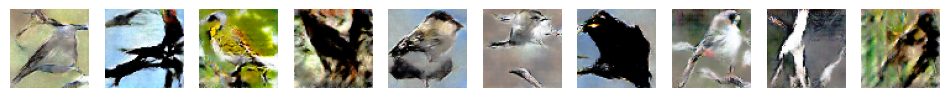

[246/500][165/165]	(eta: 00:01:02)	loss_d: 0.0185	loss_g: 5.8365	real_avg: 0.9990	fake_avg: 0.0169 / 0.01920
[247/500][165/165]	(eta: 00:01:06)	loss_d: 0.0011	loss_g: 10.7451	real_avg: 0.9990	fake_avg: 0.0001 / 0.00020
[248/500][165/165]	(eta: 00:01:06)	loss_d: 0.0084	loss_g: 9.9313	real_avg: 0.9921	fake_avg: 0.0001 / 0.00032
[249/500][165/165]	(eta: 00:01:06)	loss_d: 0.0023	loss_g: 8.6280	real_avg: 0.9997	fake_avg: 0.0019 / 0.002342
[250/500][165/165]	(eta: 00:01:06)	loss_d: 0.0356	loss_g: 5.9061	real_avg: 0.9724	fake_avg: 0.0051 / 0.01193
Generator saved to: './models/gen_gl=5.64583158493042_dl=0.04862091317772865_e=251_t=1685469434.pth'
Discriminator saved to: './models/dis_gl=5.64583158493042_dl=0.04862091317772865_e=251_t=1685469434.pth'
Examples generated for fixed noise:


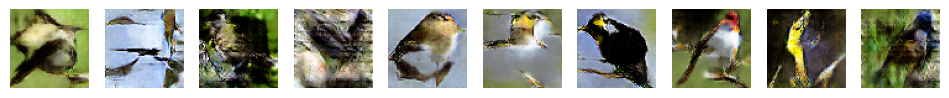

[251/500][165/165]	(eta: 00:01:02)	loss_d: 0.0006	loss_g: 11.6351	real_avg: 1.0000	fake_avg: 0.0006 / 0.0001
[252/500][165/165]	(eta: 00:01:06)	loss_d: 0.0009	loss_g: 9.7775	real_avg: 0.9998	fake_avg: 0.0007 / 0.00098
[253/500][165/165]	(eta: 00:01:06)	loss_d: 0.0023	loss_g: 9.6108	real_avg: 0.9994	fake_avg: 0.0017 / 0.00063
[254/500][165/165]	(eta: 00:01:06)	loss_d: 0.0038	loss_g: 7.0113	real_avg: 1.0000	fake_avg: 0.0038 / 0.012700
[255/500][165/165]	(eta: 00:01:05)	loss_d: 0.6782	loss_g: 2.4275	real_avg: 0.6518	fake_avg: 0.0230 / 0.19060
Examples generated for fixed noise:


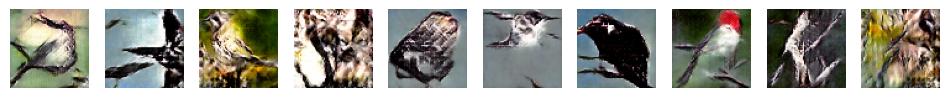

[256/500][165/165]	(eta: 00:01:02)	loss_d: 0.0314	loss_g: 16.7056	real_avg: 1.0000	fake_avg: 0.0217 / 0.0000
[257/500][165/165]	(eta: 00:01:05)	loss_d: 0.2187	loss_g: 6.8994	real_avg: 0.9995	fake_avg: 0.1347 / 0.01505
[258/500][165/165]	(eta: 00:01:05)	loss_d: 0.0034	loss_g: 10.7600	real_avg: 0.9982	fake_avg: 0.0015 / 0.0004
[259/500][165/165]	(eta: 00:01:06)	loss_d: 0.5422	loss_g: 2.9480	real_avg: 0.7119	fake_avg: 0.0011 / 0.19000
[260/500][165/165]	(eta: 00:01:06)	loss_d: 3.1158	loss_g: 4.4922	real_avg: 0.1585	fake_avg: 0.0000 / 0.07250
Generator saved to: './models/gen_gl=7.748872756958008_dl=0.3016771376132965_e=261_t=1685470123.pth'
Discriminator saved to: './models/dis_gl=7.748872756958008_dl=0.3016771376132965_e=261_t=1685470123.pth'
Examples generated for fixed noise:


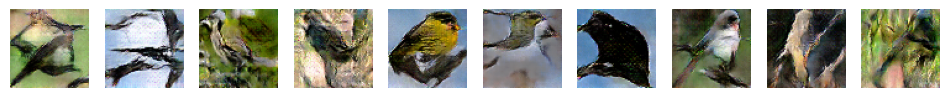

[261/500][165/165]	(eta: 00:01:02)	loss_d: 0.0377	loss_g: 7.8437	real_avg: 0.9920	fake_avg: 0.0255 / 0.00300
[262/500][165/165]	(eta: 00:01:06)	loss_d: 0.0080	loss_g: 9.0578	real_avg: 1.0000	fake_avg: 0.0076 / 0.00102
[263/500][165/165]	(eta: 00:01:06)	loss_d: 0.1259	loss_g: 18.5689	real_avg: 1.0000	fake_avg: 0.1058 / 0.0000
[264/500][165/165]	(eta: 00:01:05)	loss_d: 0.0020	loss_g: 11.3716	real_avg: 1.0000	fake_avg: 0.0020 / 0.0007
[265/500][165/165]	(eta: 00:01:05)	loss_d: 0.0000	loss_g: 14.4416	real_avg: 1.0000	fake_avg: 0.0000 / 0.0001
Examples generated for fixed noise:


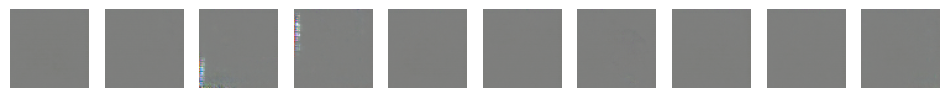

[266/500][165/165]	(eta: 00:01:02)	loss_d: 0.0000	loss_g: 19.7199	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
[267/500][165/165]	(eta: 00:01:05)	loss_d: 0.0000	loss_g: 19.2207	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
[268/500][165/165]	(eta: 00:01:06)	loss_d: 0.0000	loss_g: 31.1763	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000
[269/500][ 63/165]	(eta: 00:00:41)	loss_d: 0.0000	loss_g: 75.7105	real_avg: 1.0000	fake_avg: 0.0000 / 0.0000

KeyboardInterrupt: 

In [11]:
fixed_noise = torch.randn(batch, latent_dim, device=device)
loss = nn.BCELoss()

save_freq = 10 # epochs
gen_freq = 5 # epochs
view_limit = 10

optimizer_d = optim.NAdam(gan_discriminator.parameters(), lr=2e-4, betas=(0.5, 0.9))
optimizer_g = optim.NAdam(gan_generator.parameters(), lr=1.5e-4, betas=(0.5, 0.9))

losses_d = []
losses_g = []

time_buffer = None

for epoch in range(epochs):
    for i, data in enumerate(train_dataloader, 0):
        label = torch.full((batch, ), 1.0, dtype=torch.float, device=device)  # create tensor of real labels (1.0)

        # ----- Train the discriminator
        start = time.time()

        # pass for real data
        gan_discriminator.zero_grad()  # clear grads for discriminator
        real_data = data[0].to(device)  # load real data to selected device
        output = gan_discriminator(real_data).view(-1)  # forward pass
        loss_dis_real = loss(output, label)  # calculate the loss
        loss_dis_real.backward()  # calculate the gradient
        real_mean = output.mean().item()  # calculate the average loss for the given batch

        # pass for fake data
        noise = torch.randn(batch, latent_dim, device=device)  # create random noice for generator
        label.fill_(0.0)  # fill the label with fake label value (0.0)
        fake_data = gan_generator(noise)  # forward pass for generator (generate images)
        output = gan_discriminator(fake_data.detach()).view(-1)  # forward pass
        loss_dis_fake = loss(output, label)  # calculate the loss
        loss_dis_fake.backward()  # calculate the gradient
        fake_1_mean = output.mean().item()  # calculate the average loss for generated batch

        # apply gradient
        loss_dis = loss_dis_real + loss_dis_fake  # calculate discriminator loss
        optimizer_d.step()  # apply the gradient for discriminator

        # ----- Train the generator
        gan_generator.zero_grad()  # clear grads for generator
        label.fill_(1.0)  # fake labels are real for generator cost
        output = gan_discriminator(fake_data).view(-1)  # forward pass for fake data with updated discriminator
        loss_gen = loss(output, label)  # calculate generator loss
        loss_gen.backward()  # calculate gradient
        fake_2_mean = output.mean().item()  # calculate the average batch loss for the generator
        optimizer_g.step()  # apply the gradient for generator

        end = time.time()
        
        # save learning state
        if epoch % save_freq == 0 and epoch > 0 and i == 0:
            gen_filename = f'./models/gen_gl={loss_gen.item()}_dl={loss_dis.item()}_e={epoch+1}_t={int(time.time())}.pth'
            dis_filename = f'./models/dis_gl={loss_gen.item()}_dl={loss_dis.item()}_e={epoch+1}_t={int(time.time())}.pth'
            torch.save(gan_generator.state_dict(), gen_filename)
            torch.save(gan_discriminator.state_dict(), dis_filename)
            print(f"Generator saved to: '{gen_filename}'")
            print(f"Discriminator saved to: '{dis_filename}'")
            
        # log generation status
        if epoch % gen_freq == 0 and i == 0: 
            with torch.no_grad():
                fake = gan_generator(fixed_noise).detach().cpu()
                
            print("Examples generated for fixed noise:")
            fake = fake[:view_limit]
            fig = plt.figure(figsize=(12, 8))
            for i, image in enumerate(fake):
                fig.add_subplot(1, view_limit, i+1)
                plt.imshow((np.transpose(image.numpy(), (1, 2, 0)) + 1) * 0.5)
                plt.axis('off')
            plt.show()
            
        # output training stats
        time_left = (end-start) * (len(train_dataloader) - (i+1))
        if time_buffer is None:
            time_buffer = time_left
        if i == len(train_dataloader)-1:
            time_left = time_buffer
        print('\r[%3d/%3d][%3d/%3d]\t(eta: %s)\tloss_d: %.4f\tloss_g: %.4f\treal_avg: %.4f\tfake_avg: %.4f / %.4f'
              % ((epoch+1), epochs, (i+1), len(train_dataloader), time.strftime('%H:%M:%S', time.gmtime(time_left)),
                 loss_dis.item(), loss_gen.item(), real_mean, fake_1_mean, fake_2_mean), end='')
        
        # restart status printer
        if i == len(train_dataloader)-1:
            time_buffer = None
            print()
            
        # save losses
        losses_g.append(loss_gen.item())
        losses_d.append(loss_dis.item())

#### Save trained generator and discriminator

In [18]:
torch.save(gan_generator.state_dict(), './gen.pth')
torch.save(gan_discriminator.state_dict(), './dis.pth')

#### Evaluate the training

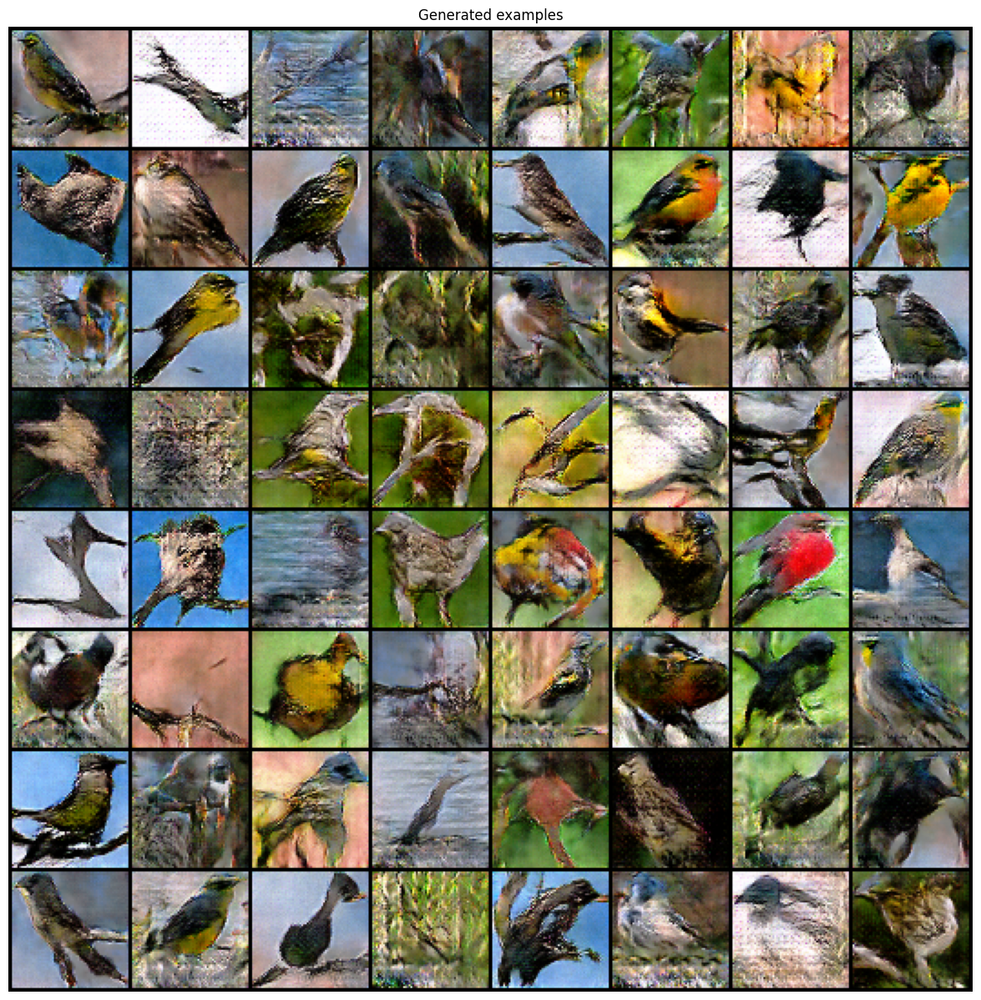

In [20]:
out = gan_generator(torch.randn(batch, latent_dim, device=device)).detach().cpu()
plt.figure(figsize=(15, 15))
plt.axis('off')
plt.title("Generated examples")
plt.imshow(np.transpose(vutils.make_grid((out+1)/2.0, padding=2).numpy(), (1, 2, 0)))
plt.show()

In [22]:
def plot_history(losses_g, losses_d):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(losses_g, label="generator")
    plt.plot(losses_d, label="discriminator")
    plt.xlabel("iterations")
    plt.ylabel("loss")
    plt.legend()
    plt.show()

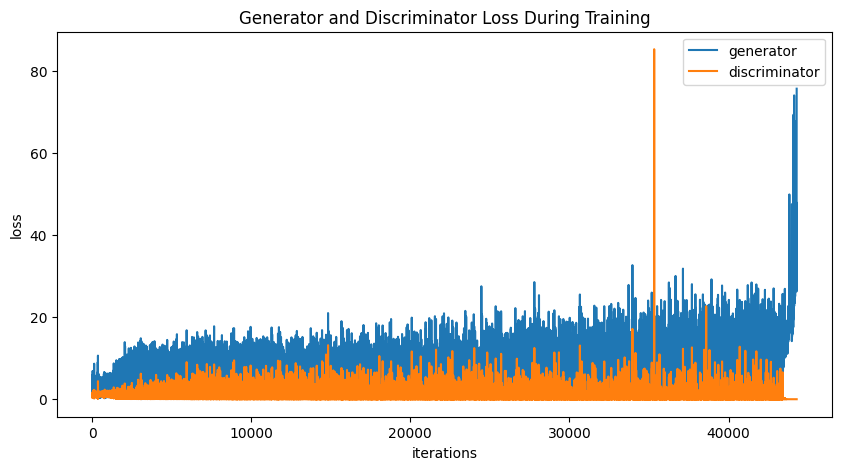

In [23]:
plot_history(losses_g, losses_d)

In [27]:
def compress_loss(loss, steps):
    return [np.average(loss[steps*i:steps*(i+1)]) for i in range(len(loss)//steps)]

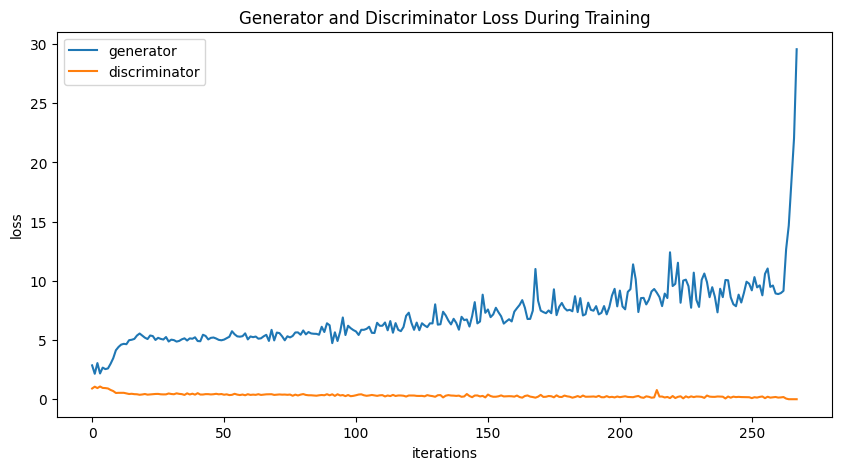

In [28]:
plot_history(compress_loss(losses_g, len(train_dataloader)), compress_loss(losses_d, len(train_dataloader)))

#### Load the trained model if needed

In [ ]:
gan_generator.load_state_dict(torch.load('./models/gpu_epoch=250/gen.pth'))
gan_discriminator.load_state_dict(torch.load('./models/gpu_epoch=250/dis.pth'))